# Converting the images into the dataset and recording the landmarks from the images into the csv file

In [7]:
import os
import cv2
import mediapipe as mp
import glob
import pandas as pd
import argparse
import numpy as np
import math

path_data_dir = "Data1/Test"
path_to_save = "Output/data1.csv"

##############
torso_size_multiplier = 2.5
n_landmarks = 33
n_dimensions = 3
landmark_names = [
    'nose',
    'left_eye_inner', 'left_eye', 'left_eye_outer',
    'right_eye_inner', 'right_eye', 'right_eye_outer',
    'left_ear', 'right_ear',
    'mouth_left', 'mouth_right',
    'left_shoulder', 'right_shoulder',
    'left_elbow', 'right_elbow',
    'left_wrist', 'right_wrist',
    'left_pinky_1', 'right_pinky_1',
    'left_index_1', 'right_index_1',
    'left_thumb_2', 'right_thumb_2',
    'left_hip', 'right_hip',
    'left_knee', 'right_knee',
    'left_ankle', 'right_ankle',
    'left_heel', 'right_heel',
    'left_foot_index', 'right_foot_index',
]
##############

mp_pose = mp.solutions.pose
pose = mp_pose.Pose()

class_list = os.listdir(path_data_dir)
class_list = sorted(class_list)

col_names = []
for i in range(n_landmarks):
    name = mp_pose.PoseLandmark(i).name
    name_x = name + '_X'
    name_y = name + '_Y'
    name_z = name + '_Z'
    name_v = name + '_V'
    col_names.append(name_x)
    col_names.append(name_y)
    col_names.append(name_z)
    col_names.append(name_v)

full_lm_list = []
target_list = []
for class_name in class_list:
    path_to_class = os.path.join(path_data_dir, class_name)
    # Search for only .jpg files
    print(path_to_class)
    img_list = glob.glob(os.path.join(path_to_class, '*.jpg'))
    print(img_list)
    img_list = sorted(img_list)

    img_list = sorted(img_list)
    print(img_list)
    # Read reach Images in the each classes
    for img in img_list:
        image = cv2.imread(img)
        h, w, c = image.shape
        print(h,w,c)
        if image is None:
            print(
                f'[ERROR] Error in reading {img} -- Skipping.....\n[INFO] Taking next Image')
            continue
        else:
            img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            result = pose.process(img_rgb)
            if result.pose_landmarks:
                lm_list = []
                print('detected')
                for landmarks in result.pose_landmarks.landmark:
                    # Preprocessing
                    max_distance = 0
                    lm_list.append(landmarks)
                center_x = (lm_list[landmark_names.index('right_hip')].x +
                            lm_list[landmark_names.index('left_hip')].x)*0.5
                center_y = (lm_list[landmark_names.index('right_hip')].y +
                            lm_list[landmark_names.index('left_hip')].y)*0.5

                shoulders_x = (lm_list[landmark_names.index('right_shoulder')].x +
                               lm_list[landmark_names.index('left_shoulder')].x)*0.5
                shoulders_y = (lm_list[landmark_names.index('right_shoulder')].y +
                               lm_list[landmark_names.index('left_shoulder')].y)*0.5

                for lm in lm_list:
                    distance = math.sqrt(
                        (lm.x - center_x)**2 + (lm.y - center_y)**2)
                    if(distance > max_distance):
                        max_distance = distance
                torso_size = math.sqrt(
                    (shoulders_x - center_x)**2 + (shoulders_y - center_y)**2)
                max_distance = max(
                    torso_size*torso_size_multiplier, max_distance)

                pre_lm = list(np.array([[(landmark.x-center_x)/max_distance, (landmark.y-center_y)/max_distance,
                              landmark.z/max_distance, landmark.visibility] for landmark in lm_list]).flatten())

                full_lm_list.append(pre_lm)
                target_list.append(class_name)
                print(full_lm_list)
                print(target_list)

            print(f'{os.path.split(img)[1]} Landmarks added Successfully')
    print(f'[INFO] {class_name} Successfully Completed')

print('[INFO] Landmarks from Dataset Successfully Completed')


Data1/Test\Running
['Data1/Test\\Running\\Walking_103.jpg', 'Data1/Test\\Running\\Walking_104.jpg', 'Data1/Test\\Running\\Walking_124.jpg', 'Data1/Test\\Running\\Walking_125.jpg', 'Data1/Test\\Running\\Walking_13.jpg', 'Data1/Test\\Running\\Walking_14.jpg', 'Data1/Test\\Running\\Walking_140.jpg', 'Data1/Test\\Running\\Walking_149.jpg', 'Data1/Test\\Running\\Walking_151.jpg', 'Data1/Test\\Running\\Walking_152.jpg', 'Data1/Test\\Running\\Walking_16.jpg', 'Data1/Test\\Running\\Walking_169.jpg', 'Data1/Test\\Running\\Walking_17.jpg', 'Data1/Test\\Running\\Walking_170.jpg', 'Data1/Test\\Running\\Walking_175.jpg', 'Data1/Test\\Running\\Walking_176.jpg', 'Data1/Test\\Running\\Walking_184.jpg', 'Data1/Test\\Running\\Walking_185.jpg', 'Data1/Test\\Running\\Walking_187.jpg', 'Data1/Test\\Running\\Walking_188.jpg', 'Data1/Test\\Running\\Walking_193.jpg', 'Data1/Test\\Running\\Walking_194.jpg', 'Data1/Test\\Running\\Walking_196.jpg', 'Data1/Test\\Running\\Walking_197.jpg', 'Data1/Test\\Running\\Wa

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



360 600 3
detected
[[0.19252816632660216, -0.4506350603903676, -0.12281939557718817, 1.0, 0.19318974581517553, -0.4779214027057032, -0.08785547965234412, 1.0, 0.19323426890814327, -0.4785148880520906, -0.08777284067621595, 1.0, 0.19314756111994769, -0.47948518281028596, -0.08766449686293189, 1.0, 0.18811570332731467, -0.4828034159711632, -0.14291578451772294, 1.0, 0.18405774142539652, -0.48697783008052853, -0.14291472054675128, 1.0, 0.17959439489128876, -0.4913517095171076, -0.1429119612374182, 1.0, 0.17414358975957472, -0.48889288429359956, 0.0997416547461753, 0.9999998807907104, 0.1551778745862266, -0.5018351207287314, -0.15470833601204276, 1.0, 0.1825360057121772, -0.4268066938848459, -0.04850690427734005, 1.0, 0.17541965340623983, -0.4339371233451775, -0.12152187713125946, 1.0, 0.1437922159906386, -0.32763253319417895, 0.30208207705708295, 0.9999997615814209, 0.055382308080157816, -0.447176803972825, -0.201418310238143, 1.0, 0.16527381329234844, -0.13776286787409517, 0.195584487248

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



279 333 3
detected
[[0.19252816632660216, -0.4506350603903676, -0.12281939557718817, 1.0, 0.19318974581517553, -0.4779214027057032, -0.08785547965234412, 1.0, 0.19323426890814327, -0.4785148880520906, -0.08777284067621595, 1.0, 0.19314756111994769, -0.47948518281028596, -0.08766449686293189, 1.0, 0.18811570332731467, -0.4828034159711632, -0.14291578451772294, 1.0, 0.18405774142539652, -0.48697783008052853, -0.14291472054675128, 1.0, 0.17959439489128876, -0.4913517095171076, -0.1429119612374182, 1.0, 0.17414358975957472, -0.48889288429359956, 0.0997416547461753, 0.9999998807907104, 0.1551778745862266, -0.5018351207287314, -0.15470833601204276, 1.0, 0.1825360057121772, -0.4268066938848459, -0.04850690427734005, 1.0, 0.17541965340623983, -0.4339371233451775, -0.12152187713125946, 1.0, 0.1437922159906386, -0.32763253319417895, 0.30208207705708295, 0.9999997615814209, 0.055382308080157816, -0.447176803972825, -0.201418310238143, 1.0, 0.16527381329234844, -0.13776286787409517, 0.195584487248

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



['Data1/Test\\Walking\\Walking_101.jpg', 'Data1/Test\\Walking\\Walking_102.jpg', 'Data1/Test\\Walking\\Walking_11.jpg', 'Data1/Test\\Walking\\Walking_118.jpg', 'Data1/Test\\Walking\\Walking_119.jpg', 'Data1/Test\\Walking\\Walking_12.jpg', 'Data1/Test\\Walking\\Walking_128.jpg', 'Data1/Test\\Walking\\Walking_129.jpg', 'Data1/Test\\Walking\\Walking_138.jpg', 'Data1/Test\\Walking\\Walking_139.jpg', 'Data1/Test\\Walking\\Walking_146.jpg', 'Data1/Test\\Walking\\Walking_147.jpg', 'Data1/Test\\Walking\\Walking_154.jpg', 'Data1/Test\\Walking\\Walking_158.jpg', 'Data1/Test\\Walking\\Walking_159.jpg', 'Data1/Test\\Walking\\Walking_172.jpg', 'Data1/Test\\Walking\\Walking_173.jpg', 'Data1/Test\\Walking\\Walking_174.jpg', 'Data1/Test\\Walking\\Walking_178.jpg', 'Data1/Test\\Walking\\Walking_179.jpg', 'Data1/Test\\Walking\\Walking_18.jpg', 'Data1/Test\\Walking\\Walking_19.jpg', 'Data1/Test\\Walking\\Walking_190.jpg', 'Data1/Test\\Walking\\Walking_191.jpg', 'Data1/Test\\Walking\\Walking_192.jpg', 'Da

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Walking_128.jpg Landmarks added Successfully
316 474 3
detected
[[0.19252816632660216, -0.4506350603903676, -0.12281939557718817, 1.0, 0.19318974581517553, -0.4779214027057032, -0.08785547965234412, 1.0, 0.19323426890814327, -0.4785148880520906, -0.08777284067621595, 1.0, 0.19314756111994769, -0.47948518281028596, -0.08766449686293189, 1.0, 0.18811570332731467, -0.4828034159711632, -0.14291578451772294, 1.0, 0.18405774142539652, -0.48697783008052853, -0.14291472054675128, 1.0, 0.17959439489128876, -0.4913517095171076, -0.1429119612374182, 1.0, 0.17414358975957472, -0.48889288429359956, 0.0997416547461753, 0.9999998807907104, 0.1551778745862266, -0.5018351207287314, -0.15470833601204276, 1.0, 0.1825360057121772, -0.4268066938848459, -0.04850690427734005, 1.0, 0.17541965340623983, -0.4339371233451775, -0.12152187713125946, 1.0, 0.1437922159906386, -0.32763253319417895, 0.30208207705708295, 0.9999997615814209, 0.055382308080157816, -0.447176803972825, -0.201418310238143, 1.0, 0.1652738132

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Walking_18.jpg Landmarks added Successfully
292 195 3
detected
[[0.19252816632660216, -0.4506350603903676, -0.12281939557718817, 1.0, 0.19318974581517553, -0.4779214027057032, -0.08785547965234412, 1.0, 0.19323426890814327, -0.4785148880520906, -0.08777284067621595, 1.0, 0.19314756111994769, -0.47948518281028596, -0.08766449686293189, 1.0, 0.18811570332731467, -0.4828034159711632, -0.14291578451772294, 1.0, 0.18405774142539652, -0.48697783008052853, -0.14291472054675128, 1.0, 0.17959439489128876, -0.4913517095171076, -0.1429119612374182, 1.0, 0.17414358975957472, -0.48889288429359956, 0.0997416547461753, 0.9999998807907104, 0.1551778745862266, -0.5018351207287314, -0.15470833601204276, 1.0, 0.1825360057121772, -0.4268066938848459, -0.04850690427734005, 1.0, 0.17541965340623983, -0.4339371233451775, -0.12152187713125946, 1.0, 0.1437922159906386, -0.32763253319417895, 0.30208207705708295, 0.9999997615814209, 0.055382308080157816, -0.447176803972825, -0.201418310238143, 1.0, 0.16527381329

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



1390 957 3
detected
[[0.19252816632660216, -0.4506350603903676, -0.12281939557718817, 1.0, 0.19318974581517553, -0.4779214027057032, -0.08785547965234412, 1.0, 0.19323426890814327, -0.4785148880520906, -0.08777284067621595, 1.0, 0.19314756111994769, -0.47948518281028596, -0.08766449686293189, 1.0, 0.18811570332731467, -0.4828034159711632, -0.14291578451772294, 1.0, 0.18405774142539652, -0.48697783008052853, -0.14291472054675128, 1.0, 0.17959439489128876, -0.4913517095171076, -0.1429119612374182, 1.0, 0.17414358975957472, -0.48889288429359956, 0.0997416547461753, 0.9999998807907104, 0.1551778745862266, -0.5018351207287314, -0.15470833601204276, 1.0, 0.1825360057121772, -0.4268066938848459, -0.04850690427734005, 1.0, 0.17541965340623983, -0.4339371233451775, -0.12152187713125946, 1.0, 0.1437922159906386, -0.32763253319417895, 0.30208207705708295, 0.9999997615814209, 0.055382308080157816, -0.447176803972825, -0.201418310238143, 1.0, 0.16527381329234844, -0.13776286787409517, 0.19558448724

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



1390 957 3
detected
[[0.19252816632660216, -0.4506350603903676, -0.12281939557718817, 1.0, 0.19318974581517553, -0.4779214027057032, -0.08785547965234412, 1.0, 0.19323426890814327, -0.4785148880520906, -0.08777284067621595, 1.0, 0.19314756111994769, -0.47948518281028596, -0.08766449686293189, 1.0, 0.18811570332731467, -0.4828034159711632, -0.14291578451772294, 1.0, 0.18405774142539652, -0.48697783008052853, -0.14291472054675128, 1.0, 0.17959439489128876, -0.4913517095171076, -0.1429119612374182, 1.0, 0.17414358975957472, -0.48889288429359956, 0.0997416547461753, 0.9999998807907104, 0.1551778745862266, -0.5018351207287314, -0.15470833601204276, 1.0, 0.1825360057121772, -0.4268066938848459, -0.04850690427734005, 1.0, 0.17541965340623983, -0.4339371233451775, -0.12152187713125946, 1.0, 0.1437922159906386, -0.32763253319417895, 0.30208207705708295, 0.9999997615814209, 0.055382308080157816, -0.447176803972825, -0.201418310238143, 1.0, 0.16527381329234844, -0.13776286787409517, 0.19558448724

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



# Saving co-ordinates into the csv file

In [8]:
path_to_save = "Output/data2.csv"
data_x = pd.DataFrame(full_lm_list, columns=col_names)
data = data_x.assign(Pose_Class=target_list)
data.to_csv(path_to_save, encoding='utf-8', index=False)
print(f'[INFO] Successfully Saved Landmarks data into {path_to_save}')


[INFO] Successfully Saved Landmarks data into Output/data2.csv


[INFO] Loaded csv Dataset


C:\Users\saira\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\core\dense.py:86: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 512)                 │          68,096 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 5)                   │           1,285 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 200,709 (784.02 KB)

 Trainable params: 200,709 (784.02 KB)

 Non-trainable params: 0 (0.00 B)

Model Summary:  None
[INFO] Model Training Started ...
Epoch 1/200
31/40 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.4740 - loss: 1.2038
Epoch 1: val_accuracy improved from -inf to 0.82911, saving model to models/model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - accuracy: 0.5188 - loss: 1.1219 - val_accuracy: 0.8291 - val_loss: 0.5302
Epoch 2/200
31/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8641 - loss: 0.4306
Epoch 2: val_accuracy improved from 0.82911 to 0.91139, saving model to models/model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8728 - loss: 0.4117 - val_accuracy: 0.9114 - val_loss: 0.3106
Epoch 3/200
34/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9298 - loss: 0.2160
Epoch 3: val_accuracy improved from 0.91139 to 0.92405, saving model to models/model.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9324 - loss: 0.2144 - val_accuracy: 0.9241 - val_loss: 0.2915
Epoch 4/200
33/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9685 - lo

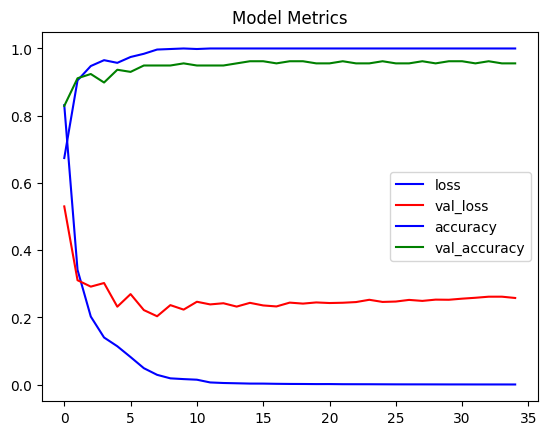

In [9]:
import keras
import pandas as pd
from keras import layers, Sequential
import argparse
from sklearn.model_selection import train_test_split
from matplotlib import pyplot as plt
import os



path_csv = "Output/data1.csv"
path_to_save = "models/model.keras"

# Load .csv Data
df = pd.read_csv(path_csv)
class_list = df['Pose_Class'].unique()
class_list = sorted(class_list)
class_number = len(class_list)

# Create training and validation splits
x = df.copy()
y = x.pop('Pose_Class')
y, _ = y.factorize()
x = x.astype('float64')
y = keras.utils.to_categorical(y)

x_train, x_test, y_train, y_test = train_test_split(x, y,
                                                    test_size=0.2,
                                                    random_state=0)

print('[INFO] Loaded csv Dataset')

model = Sequential([
    layers.Dense(512, activation='relu', input_shape=[x_train.shape[1]]),
    layers.Dense(256, activation='relu'),
    layers.Dense(class_number, activation="softmax")
])

# Model Summary
print('Model Summary: ', model.summary())

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Add a checkpoint callback to store the checkpoint that has the highest
# validation accuracy.
checkpoint_path = path_to_save
checkpoint = keras.callbacks.ModelCheckpoint(checkpoint_path,
                                             monitor='val_accuracy',
                                             verbose=1,
                                             save_best_only=True,
                                             mode='max')
earlystopping = keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                              patience=20)

print('[INFO] Model Training Started ...')
# Start training
history = model.fit(x_train, y_train,
                    epochs=200,
                    batch_size=16,
                    validation_data=(x_test, y_test),
                    callbacks=[checkpoint, earlystopping])

print('[INFO] Model Training Completed')
print(f'[INFO] Model Successfully Saved in /{path_to_save}')

# Plot History
metric_loss = history.history['loss']
metric_val_loss = history.history['val_loss']
metric_accuracy = history.history['accuracy']
metric_val_accuracy = history.history['val_accuracy']

# Construct a range object which will be used as x-axis (horizontal plane) of the graph.
epochs = range(len(metric_loss))

# Plot the Graph.
plt.plot(epochs, metric_loss, 'blue', label=metric_loss)
plt.plot(epochs, metric_val_loss, 'red', label=metric_val_loss)
plt.plot(epochs, metric_accuracy, 'blue', label=metric_accuracy)
plt.plot(epochs, metric_val_accuracy, 'green', label=metric_val_accuracy)

# Add title to the plot.
plt.title(str('Model Metrics'))

# Add legend to the plot.
plt.legend(['loss', 'val_loss', 'accuracy', 'val_accuracy'])

# If the plot already exist, remove
plot_png = os.path.exists('metrics.png')
if plot_png:
    os.remove('metrics.png')
    plt.savefig('metrics.png', bbox_inches='tight')
else:
    plt.savefig('metrics.png', bbox_inches='tight')
print('[INFO] Successfully Saved metrics.png')

In [3]:
import keras
from keras import layers, Sequential
from keras.models import load_model
from sklearn.model_selection import train_test_split
from matplotlib import pyplot as plt
import cv2
import mediapipe as mp
import glob
import os
import pandas as pd
import numpy as np
import math

# ap = argparse.ArgumentParser()
# ap.add_argument("-m", "--model", type=str, required=True,
#                 help="path to saved .h5 model, eg: dir/model.h5")
# ap.add_argument("-c", "--conf", type=float, required=True,
#                 help="min prediction conf to detect pose class (0<conf<1)")
# ap.add_argument("-i", "--source", type=str, required=True,
#                 help="path to sample image")
# ap.add_argument("--save", action='store_true',
#                 help="Save video")

# args = vars(ap.parse_args())
source = "Hello_1.mp4"
path_saved_model = "models/model1.keras"
threshold = 0.2
save = "Output"
print('Hello')
##############
torso_size_multiplier = 2.5
n_landmarks = 33
n_dimensions = 3
landmark_names = [
    'nose',
    'left_eye_inner', 'left_eye', 'left_eye_outer',
    'right_eye_inner', 'right_eye', 'right_eye_outer',
    'left_ear', 'right_ear',
    'mouth_left', 'mouth_right',
    'left_shoulder', 'right_shoulder',
    'left_elbow', 'right_elbow',
    'left_wrist', 'right_wrist',
    'left_pinky_1', 'right_pinky_1',
    'left_index_1', 'right_index_1',
    'left_thumb_2', 'right_thumb_2',
    'left_hip', 'right_hip',
    'left_knee', 'right_knee',
    'left_ankle', 'right_ankle',
    'left_heel', 'right_heel',
    'left_foot_index', 'right_foot_index',
]
class_names = [
    'Running','Standing','Steal','Walking','Waving'
]
##############

mp_pose = mp.solutions.pose
pose = mp_pose.Pose()

col_names = []
for i in range(n_landmarks):
    name = mp_pose.PoseLandmark(i).name
    name_x = name + '_X'
    name_y = name + '_Y'
    name_z = name + '_Z'
    name_v = name + '_V'
    col_names.append(name_x)
    col_names.append(name_y)
    col_names.append(name_z)
    col_names.append(name_v)

# Load saved model
model = load_model(path_saved_model, compile=True)




if source.endswith(('.jpg', '.jpeg', '.png')):
    path_to_img = source
    print('Entered1')
    # Load sample Image
    
    img = cv2.imread(path_to_img)
    print(img)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    result = pose.process(img_rgb)
    if result.pose_landmarks:
        lm_list = []
        for landmarks in result.pose_landmarks.landmark:
            # Preprocessing
            max_distance = 0
            lm_list.append(landmarks)
        center_x = (lm_list[landmark_names.index('right_hip')].x +
                    lm_list[landmark_names.index('left_hip')].x)*0.5
        center_y = (lm_list[landmark_names.index('right_hip')].y +
                    lm_list[landmark_names.index('left_hip')].y)*0.5

        shoulders_x = (lm_list[landmark_names.index('right_shoulder')].x +
                       lm_list[landmark_names.index('left_shoulder')].x)*0.5
        shoulders_y = (lm_list[landmark_names.index('right_shoulder')].y +
                       lm_list[landmark_names.index('left_shoulder')].y)*0.5

        for lm in lm_list:
            distance = math.sqrt((lm.x - center_x)**2 + (lm.y - center_y)**2)
            if(distance > max_distance):
                max_distance = distance
        torso_size = math.sqrt((shoulders_x - center_x) **
                               2 + (shoulders_y - center_y)**2)
        max_distance = max(torso_size*torso_size_multiplier, max_distance)

        pre_lm = list(np.array([[(landmark.x-center_x)/max_distance, (landmark.y-center_y)/max_distance,
                                 landmark.z/max_distance, landmark.visibility] for landmark in lm_list]).flatten())
        data = pd.DataFrame([pre_lm], columns=col_names)
        predict = model.predict(data)[0]
        print('predicted')
        if max(predict) > threshold:
            pose_class = class_names[predict.argmax()]
            print('predictions: ', predict)
            print('predicted Pose Class: ', pose_class)
        else:
            pose_class = 'Unknown Pose'
            print('[INFO] Predictions is below given Confidence!!')

    # Show Result
    img = cv2.putText(
        img, f'{class_names[predict.argmax()]}',
        (40, 50), cv2.FONT_HERSHEY_PLAIN,
        2, (255, 0, 255), 2
    )

    if save:
        os.makedirs('ImageOutput', exist_ok=True)
        img_full_name = os.path.split(path_to_img)[1]
        img_name = os.path.splitext(img_full_name)[0]
        path_to_save_img = f'ImageOutput/{img_name}.jpg'
        cv2.imwrite(f'{path_to_save_img}', img)
        print(f'[INFO] Output Image Saved in {path_to_save_img}')

    cv2.imshow('Output Image', img)
    if cv2.waitKey(0) & 0xFF == ord('q'):
        cv2.destroyAllWindows()
    print('[INFO] Inference on Test Image is Ended...')

else:
    # Web-cam
    if source.isnumeric():
        source = int(source)

    cap = cv2.VideoCapture(source)
    source_width = int(cap.get(3))
    source_height = int(cap.get(4))
    cv2.namedWindow('Resized Video', cv2.WINDOW_NORMAL)

    # Resize the window
    cv2.resizeWindow('Resized Video', 400, 400)  # Specify the desired width and height



    # Write Video
    if save:
        out_video = cv2.VideoWriter('output.avi', 
                            cv2.VideoWriter_fourcc(*'MJPG'),
                            10, (source_width, source_height))

    while True:
        success, img = cap.read()
        if not success:
            print('[ERROR] Failed to Read Video feed')
            break
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        result = pose.process(img_rgb)

        if result.pose_landmarks:
            lm_list = []
            for landmarks in result.pose_landmarks.landmark:
                # Preprocessing
                max_distance = 0
                lm_list.append(landmarks)
            center_x = (lm_list[landmark_names.index('right_hip')].x +
                        lm_list[landmark_names.index('left_hip')].x)*0.5
            center_y = (lm_list[landmark_names.index('right_hip')].y +
                        lm_list[landmark_names.index('left_hip')].y)*0.5

            shoulders_x = (lm_list[landmark_names.index('right_shoulder')].x +
                           lm_list[landmark_names.index('left_shoulder')].x)*0.5
            shoulders_y = (lm_list[landmark_names.index('right_shoulder')].y +
                           lm_list[landmark_names.index('left_shoulder')].y)*0.5

            for lm in lm_list:
                distance = math.sqrt((lm.x - center_x) **
                                     2 + (lm.y - center_y)**2)
                if(distance > max_distance):
                    max_distance = distance
            torso_size = math.sqrt((shoulders_x - center_x) **
                                   2 + (shoulders_y - center_y)**2)
            max_distance = max(torso_size*torso_size_multiplier, max_distance)

            pre_lm = list(np.array([[(landmark.x-center_x)/max_distance, (landmark.y-center_y)/max_distance,
                                     landmark.z/max_distance, landmark.visibility] for landmark in lm_list]).flatten())
            data = pd.DataFrame([pre_lm], columns=col_names)
            predict = model.predict(data)[0]
            if max(predict) > threshold:
                pose_class = class_names[predict.argmax()]
                print('predictions: ', predict)
                print('predicted Pose Class: ', pose_class)
            else:
                pose_class = 'Unknown Pose'
                print('[INFO] Predictions is below given Confidence!!')

            # Show Result
            img = cv2.putText(
                img, f'{pose_class}',
                (40, 50), cv2.FONT_HERSHEY_PLAIN,
                2, (255, 0, 255), 2
            )
        # Write Video
        if save:
            out_video.write(img)

        cv2.imshow('Output Image', img)
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break
    
    cap.release()
    if save:
        out_video.release()
        print("[INFO] Out video Saved as 'output.avi'")
    cv2.destroyAllWindows()
    print('[INFO] Inference on Videostream is Ended...')

Hello
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
predictions:  [3.14098239e-01 5.29870391e-01 4.38765528e-05 1.55976489e-01
 1.09558605e-05]
predicted Pose Class:  Standing
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
predictions:  [4.1670077e-03 6.1696082e-01 1.1396981e-03 3.7773159e-01 9.2042762e-07]
predicted Pose Class:  Standing
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
predictions:  [4.1056992e-03 9.1620421e-01 8.6450134e-05 7.9603046e-02 5.7823684e-07]
predicted Pose Class:  Standing
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
predictions:  [6.3965512e-03 5.2025694e-01 7.6226766e-05 4.7326988e-01 4.3152571e-07]
predicted Pose Class:  Standing
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
predictions:  [1.1660824e-02 7.5521797e-01 3.4450335e-05 2.3308618e-01 6.0250676e-07]
predicted Pose Class:  Standing
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
predictions:  [2.0113418e-02 3.6950535e-01 2.5400235e-05 6.1035520e-01 6.8528249e-07]
predicted Pose Class:  Walking
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
predictions:  

Code:

https://dev.to/naseemap47/custom-human-pose-classification-using-mediapipe-6fc

In [3]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3 (Dense)                      │ (None, 512)                 │          68,096 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 4)                   │           1,028 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 601,358 (2.29 MB)

 Trainable params: 200,452 (783.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 400,906 (1.53 MB)

In [2]:

path_csv = "Output/data1.csv"
path_to_save = "models/model.keras"

# Load .csv Data
df = pd.read_csv(path_csv)
class_list = df['Pose_Class'].unique()
class_list = sorted(class_list)
class_number = len(class_list)

# Create training and validation splits
x = df.copy()
y = x.pop('Pose_Class')
y, _ = y.factorize()
x = x.astype('float64')
y = keras.utils.to_categorical(y)

x_train, x_test, y_train, y_test = train_test_split(x, y,
                                                    test_size=0.2,
                                                    random_state=0)



model.evaluate(x_test,y_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 930ms/step - accuracy: 0.9355 - loss: 0.2664


[0.2664174437522888, 0.9354838728904724]

In [26]:
import cv2
import keras
from keras.models import load_model
from sklearn.model_selection import train_test_split
import mediapipe as mp
import glob
import os
import pandas as pd
import numpy as np
import math

source = "sample_video1.mp4"
path_saved_model = "models/model.keras"
threshold = 0.2
save = "Output"

# Constants
torso_size_multiplier = 2.5
n_landmarks = 33
n_dimensions = 3
landmark_names = [
    'nose',
    'left_eye_inner', 'left_eye', 'left_eye_outer',
    'right_eye_inner', 'right_eye', 'right_eye_outer',
    'left_ear', 'right_ear',
    'mouth_left', 'mouth_right',
    'left_shoulder', 'right_shoulder',
    'left_elbow', 'right_elbow',
    'left_wrist', 'right_wrist',
    'left_pinky_1', 'right_pinky_1',
    'left_index_1', 'right_index_1',
    'left_thumb_2', 'right_thumb_2',
    'left_hip', 'right_hip',
    'left_knee', 'right_knee',
    'left_ankle', 'right_ankle',
    'left_heel', 'right_heel',
    'left_foot_index', 'right_foot_index',
]
class_names = [
    'Running','Standing','Steal','Walking','Waving'
]

mp_pose = mp.solutions.pose
pose = mp_pose.Pose()

col_names = []
for i in range(n_landmarks):
    name = mp_pose.PoseLandmark(i).name
    name_x = name + '_X'
    name_y = name + '_Y'
    name_z = name + '_Z'
    name_v = name + '_V'
    col_names.append(name_x)
    col_names.append(name_y)
    col_names.append(name_z)
    col_names.append(name_v)

# Load saved model
model = load_model(path_saved_model, compile=True)

if source.endswith(('.jpg', '.jpeg', '.png')):
    path_to_img = source
    
    # Load sample Image
    img = cv2.imread(path_to_img)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    result = pose.process(img_rgb)
    if result.pose_landmarks:
        lm_list = []
        for landmarks in result.pose_landmarks.landmark:
            # Preprocessing
            max_distance = 0
            lm_list.append(landmarks)
        center_x = (lm_list[landmark_names.index('right_hip')].x +
                    lm_list[landmark_names.index('left_hip')].x)*0.5
        center_y = (lm_list[landmark_names.index('right_hip')].y +
                    lm_list[landmark_names.index('left_hip')].y)*0.5

        shoulders_x = (lm_list[landmark_names.index('right_shoulder')].x +
                       lm_list[landmark_names.index('left_shoulder')].x)*0.5
        shoulders_y = (lm_list[landmark_names.index('right_shoulder')].y +
                       lm_list[landmark_names.index('left_shoulder')].y)*0.5

        for lm in lm_list:
            distance = math.sqrt((lm.x - center_x)**2 + (lm.y - center_y)**2)
            if(distance > max_distance):
                max_distance = distance
        torso_size = math.sqrt((shoulders_x - center_x) **
                               2 + (shoulders_y - center_y)**2)
        max_distance = max(torso_size*torso_size_multiplier, max_distance)

        pre_lm = list(np.array([[(landmark.x-center_x)/max_distance, (landmark.y-center_y)/max_distance,
                                 landmark.z/max_distance, landmark.visibility] for landmark in lm_list]).flatten())
        data = pd.DataFrame([pre_lm], columns=col_names)
        predict = model.predict(data)[0]
        if max(predict) > threshold:
            pose_class = class_names[predict.argmax()]
            print('predictions: ', predict)
            print('predicted Pose Class: ', pose_class)
        else:
            pose_class = 'Unknown Pose'
            print('[INFO] Predictions is below given Confidence!!')

    # Show Result
    img = cv2.putText(
        img, f'{class_names[predict.argmax()]}',
        (40, 50), cv2.FONT_HERSHEY_PLAIN,
        2, (255, 0, 255), 2
    )

    if save:
        os.makedirs('ImageOutput', exist_ok=True)
        img_full_name = os.path.split(path_to_img)[1]
        img_name = os.path.splitext(img_full_name)[0]
        path_to_save_img = f'ImageOutput/{img_name}.jpg'
        cv2.imwrite(f'{path_to_save_img}', img)
        print(f'[INFO] Output Image Saved in {path_to_save_img}')

    cv2.imshow('Output Image', img)
    if cv2.waitKey(0) & 0xFF == ord('q'):
        cv2.destroyAllWindows()
    print('[INFO] Inference on Test Image is Ended...')

else:
    # Web-cam
    if source.isnumeric():
        source = int(source)

    cap = cv2.VideoCapture(source)

    # Get the original dimensions of the video
    source_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    source_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Calculate the aspect ratio
    aspect_ratio = source_width / source_height

    # Set the desired window size
    window_width = 400
    window_height = int(window_width / aspect_ratio)

    # Create a resizable window
    cv2.namedWindow('Resized Video', cv2.WINDOW_NORMAL)

    # Resize the window
    cv2.resizeWindow('Resized Video', window_width, window_height)

    # Write Video
    if save:
        out_video = cv2.VideoWriter('output.avi', 
                            cv2.VideoWriter_fourcc(*'MJPG'),
                            10, (source_width, source_height))

    while True:
        success, img = cap.read()
        if not success:
            print('[ERROR] Failed to Read Video feed')
            break
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        result = pose.process(img_rgb)

        if result.pose_landmarks:
            lm_list = []
            for landmarks in result.pose_landmarks.landmark:
                # Preprocessing
                max_distance = 0
                lm_list.append(landmarks)
            center_x = (lm_list[landmark_names.index('right_hip')].x +
                        lm_list[landmark_names.index('left_hip')].x)*0.5
            center_y = (lm_list[landmark_names.index('right_hip')].y +
                        lm_list[landmark_names.index('left_hip')].y)*0.5

            shoulders_x = (lm_list[landmark_names.index('right_shoulder')].x +
                           lm_list[landmark_names.index('left_shoulder')].x)*0.5
            shoulders_y = (lm_list[landmark_names.index('right_shoulder')].y +
                           lm_list[landmark_names.index('left_shoulder')].y)*0.5

            for lm in lm_list:
                distance = math.sqrt((lm.x - center_x) **
                                     2 + (lm.y - center_y)**2)
                if(distance > max_distance):
                    max_distance = distance
            torso_size = math.sqrt((shoulders_x - center_x) **
                                   2 + (shoulders_y - center_y)**2)
            max_distance = max(torso_size*torso_size_multiplier, max_distance)

            pre_lm = list(np.array([[(landmark.x-center_x)/max_distance, (landmark.y-center_y)/max_distance,
                                     landmark.z/max_distance, landmark.visibility] for landmark in lm_list]).flatten())
            data = pd.DataFrame([pre_lm], columns=col_names)
            predict = model.predict(data)[0]
            if max(predict) > threshold:
                pose_class = class_names[predict.argmax()]
                print('predictions: ', predict)
                print('predicted Pose Class: ', pose_class)
            else:
                pose_class = 'Unknown Pose'
                print('[INFO] Predictions is below given Confidence!!')

            # Show Result
            img = cv2.putText(
                img, f'{pose_class}',
                (40, 50), cv2.FONT_HERSHEY_PLAIN,
                2, (255, 0, 255), 2
            )
        # Write Video
        if save:
            out_video.write(img)

        cv2.imshow('Resized Video', img)
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break
    
    cap.release()
    if save:
        out_video.release()
        print("[INFO] Out video Saved as 'output.avi'")
    cv2.destroyAllWindows()
    print('[INFO] Inference on Videostream is Ended...')


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
predictions:  [2.3917241e-06 4.6034109e-02 3.8949621e-03 4.6942083e-04 9.4959915e-01]
predicted Pose Class:  Waving
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
predictions:  [1.0621246e-08 2.7978307e-02 4.4946345e-03 2.2644659e-04 9.6730059e-01]
predicted Pose Class:  Waving
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
predictions:  [9.3264184e-08 1.6854866e-03 5.5698403e-03 9.6359329e-08 9.9274445e-01]
predicted Pose Class:  Waving
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
predictions:  [6.8536316e-08 7.9055345e-03 9.0055969e-03 4.9856834e-07 9.8308820e-01]
predicted Pose Class:  Waving
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
predictions:  [1.6291528e-03 3.7300661e-03 8.8105366e-02 2.6741286e-06 9.0653276e-01]
predicted Pose Class:  Waving
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
predictions:  [1.9959357e-06 3.3338002e-03 4.7943220e-03 2.4118440e-06 9.9186748e-01]
predicted Pose Class:  Waving
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
predictions:  [2.0173934e-09 7.4529485